# **Data Analysis & Feature Selection Notebook**

## Objectives

* This notebook will be used to test the dataset for use going forward by performing correlation tests & PPS analysis.

* Our aim is to reduce the number of columns significantly after the feature engineering already performed.  Using the test results from correlation and PPS, we hope to select those features with the greatest meaning for our dataset and prune it down to a lean and meaningful dataset ready for modeling.

## Inputs

* We will use the BitCoinVsMacroNasdaq_v4 dataset saved within outputs/datasets/collection

## Outputs

* Create the train and test datasets from the cleaned and tested dataset

---

# Change working directory

We need to change the working directory from its current folder to its parent folder
* We access the current directory with os.getcwd()

In [1]:
import os
current_dir = os.getcwd()
current_dir

'/workspaces/Project5/jupyter_notebooks'

We want to make the parent of the current directory the new current directory
* os.path.dirname() gets the parent directory
* os.chir() defines the new current directory

In [2]:
os.chdir(os.path.dirname(current_dir))
print("You set a new current directory")

You set a new current directory


Confirm the new current directory

In [3]:
current_dir = os.getcwd()
current_dir

'/workspaces/Project5'

---

# Analyse combined dataset

### Load and sort the data

In [15]:
import pandas as pd
df = (pd.read_csv("outputs/datasets/collection/BitCoinVsMacroNasdaq_v4.csv"))
df.head()

,Date,Bitcoin_Close,Nasdaq_Close,Gold_Close,Brent_Close,CPI,Ten_Year_Yield,Fed_Funds_Rate,M2_Money_Supply,VIX,...,Liquidity_Expansion,Liquidity_Contraction,Equity_Market_Uncertainty,Equity_Market_Fear,Low_Consumer_Sentiment,Recession_Risk,High_Unemployment,Job_Market_Recovery,Retail_Slowdown,Debt_Overhang
0,2010-07-18,0.0500,2198.229980,1181.699951,75.620003,217.605,2.99,0.18,8639.8,25.97,...,0,0,1,0,1,0,1,0,0,0
1,2010-07-19,0.0858,2198.229980,1181.699951,75.620003,217.605,2.99,0.18,8639.8,25.97,...,0,0,1,0,1,0,1,0,0,0
2,2010-07-20,0.0808,2222.489990,1191.500000,76.220001,217.605,2.98,0.18,8639.8,23.93,...,0,0,0,0,1,0,1,0,0,0
3,2010-07-21,0.0747,2187.330078,1191.599976,75.370003,217.605,2.90,0.18,8639.8,25.64,...,0,0,1,0,1,0,1,0,0,0
4,2010-07-22,0.0792,2245.889893,1195.500000,77.820000,217.605,2.96,0.18,8639.8,24.63,...,0,0,0,0,1,0,1,0,0,0


In [16]:
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values("Date")

Double check for missing data.  This time we'll feed a dataframe and reflect all columns with a missing values count.

In [20]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

null_counts = df.isnull().sum().reset_index()
null_counts.columns = ['Column', 'MissingValues']
display(null_counts)


,Column,MissingValues
0,Date,0
1,Bitcoin_Close,0
2,Nasdaq_Close,0
3,Gold_Close,0
4,Brent_Close,0
5,CPI,0
6,Ten_Year_Yield,0
7,Fed_Funds_Rate,0
8,M2_Money_Supply,0
9,VIX,0


We can see that there are a number of columns with missing data, predominantly the lag columns.  We will forward fill the data first, and then remove the remaining rows as these are lagged with no prior data and so reflect only blanks.

In [22]:
df.ffill(inplace=True)

df.dropna(inplace=True)

We can now see that there are no blanks remaining.

In [23]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

null_counts = df.isnull().sum().reset_index()
null_counts.columns = ['Column', 'MissingValues']
display(null_counts)

,Column,MissingValues
0,Date,0
1,Bitcoin_Close,0
2,Nasdaq_Close,0
3,Gold_Close,0
4,Brent_Close,0
5,CPI,0
6,Ten_Year_Yield,0
7,Fed_Funds_Rate,0
8,M2_Money_Supply,0
9,VIX,0


Check BitCoin price history and distribution

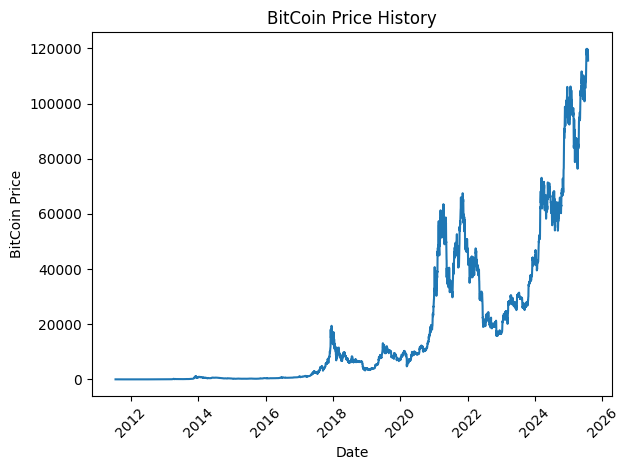

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.lineplot(data=df, x="Date", y="Bitcoin_Close")

plt.title("BitCoin Price History")
plt.xlabel("Date")
plt.ylabel("BitCoin Price")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


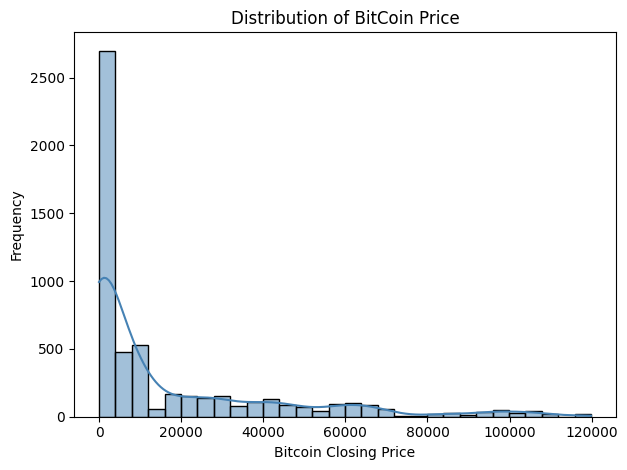

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(data=df, x="Bitcoin_Close", kde=True, bins=30, color="steelblue")

plt.title("Distribution of BitCoin Price")
plt.xlabel("Bitcoin Closing Price")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


We can see that the price of BitCoin was stable right up to 2017 and then started to gather momentum.  We then see large increases over shorter periods of time.

As a resultm the distribution of the BitCoin price is not normal and may require transforming.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.preprocessing import PowerTransformer
from feature_engine.outliers import Winsorizer
sns.set(style="whitegrid")

def FeatureEngineeringAnalysis(df, analysis_type=None):
    check_missing_values(df)
    allowed_types = ['numerical', 'outlier_winsorizer']
    check_user_entry_on_analysis_type(analysis_type, allowed_types)
    transformers = define_transformers(analysis_type)

    df_feat_eng = pd.DataFrame()
    for column in df.select_dtypes(include='number').columns:
        df_feat_eng[column] = df[column]

        df_feat_eng, applied = apply_transformers(df_feat_eng, column, transformers, analysis_type)
        transformer_evaluation(column, applied, analysis_type, df_feat_eng)

    return df_feat_eng

def check_missing_values(df):
    if df.isnull().sum().sum() != 0:
        raise ValueError("Missing values detected. Please handle them before feature engineering.")

def check_user_entry_on_analysis_type(analysis_type, allowed_types):
    if analysis_type not in allowed_types:
        raise ValueError(f"analysis_type must be one of: {allowed_types}")

def define_transformers(analysis_type):
    if analysis_type == 'numerical':
        return ['log_e', 'log_10', 'reciprocal', 'sqrt', 'box_cox', 'yeo_johnson']
    elif analysis_type == 'outlier_winsorizer':
        return ['iqr']

def apply_transformers(df, column, transformers, analysis_type):
    applied = []

    for method in transformers:
        try:
            if method == 'log_e':
                df[f"{column}_log_e"] = np.log(df[column] + 1)
            elif method == 'log_10':
                df[f"{column}_log_10"] = np.log10(df[column] + 1)
            elif method == 'reciprocal':
                df[f"{column}_reciprocal"] = 1 / (df[column] + 1e-6)
            elif method == 'sqrt':
                df[f"{column}_sqrt"] = np.sqrt(df[column])
            elif method in ['box_cox', 'yeo_johnson']:
                pt = PowerTransformer(method=method)
                df[f"{column}_{method}"] = pt.fit_transform(df[[column]])
            elif method == 'iqr':
                winsor = Winsorizer(capping_method='iqr', tail='both', fold=1.5, variables=[column])
                df[[f"{column}_iqr"]] = winsor.fit_transform(df[[column]])
            applied.append(f"{column}_{method}")
        except Exception:
            df.drop(columns=[f"{column}_{method}"], inplace=True, errors='ignore')

    return df, applied

def transformer_evaluation(column, applied, analysis_type, df):
    print(f"\nVariable: {column}")
    print(f"Applied transformations: {applied}\n")
    for col in [column] + applied:
        DiagnosticPlots_Numerical(df, col)

def DiagnosticPlots_Numerical(df, variable):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    sns.histplot(df[variable], kde=True, ax=axes[0], element="step")
    stats.probplot(df[variable], dist="norm", plot=axes[1])
    sns.boxplot(x=df[variable], ax=axes[2])

    axes[0].set_title('Histogram')
    axes[1].set_title('QQ Plot')
    axes[2].set_title('Boxplot')
    fig.suptitle(f"{variable}", fontsize=16)
    plt.tight_layout()
    plt.show()


---

# Perform correlation & PPS review

Here, we will perform a Spearman correlation review, which tells us the monotonic relationship between features i.e. as one increases, the other increases or decreases, but not necessarily at the same rate.

In [28]:
corr_spearman = df.corr(method='spearman', numeric_only=True)['Bitcoin_Close'].drop('Bitcoin_Close').apply(abs).sort_values(ascending=False)
corr_spearman

Nasdaq_7d_avg                         0.976519
Nasdaq_Close_lag1                     0.976515
Nasdaq_Close                          0.976474
Nasdaq_Close_lag3                     0.976422
Nasdaq_Close_lag7                     0.976238
Nasdaq_30d_avg                        0.976187
Nasdaq_90d_avg                        0.975056
Nasdaq_Close_lag30                    0.974614
Nasdaq_Close_lag90                    0.970437
Nasdaq_365d_avg                       0.967329
CPI                                   0.964855
CPI_lag30                             0.964172
CPI_lag90                             0.962909
CPI_lag365                            0.959237
Retail_Sales                          0.957093
Real_GDP                              0.956039
Real_GDP_lag30                        0.954939
Retail_Sales_lag30                    0.953892
M2_Money_Supply                       0.953350
Real_GDP_lag90                        0.952217
Retail_Sales_lag90                    0.951496
M2_Money_Supp

We can see a number of highly correlated absolute features in the dataset.  Many of which are above 90%.

We will now perform a Pearson correlation test, which measures the linear relationship between features i.e. each increase in one feature causes a fixed or proportional change in another

In [29]:
corr_pearson = df.corr(method='pearson', numeric_only=True)['Bitcoin_Close'].drop('Bitcoin_Close').apply(abs).sort_values(ascending=False)
corr_pearson

Nasdaq_Close_lag1                     0.918619
Nasdaq_7d_avg                         0.918571
Nasdaq_Close                          0.918533
Nasdaq_Close_lag3                     0.918349
Nasdaq_Close_lag7                     0.917767
Nasdaq_30d_avg                        0.917443
Nasdaq_90d_avg                        0.915057
Nasdaq_Close_lag30                    0.913837
Nasdaq_Close_lag90                    0.905995
Nasdaq_365d_avg                       0.896215
Gold_90d_avg                          0.886405
Gold_30d_avg                          0.885580
Gold_7d_avg                           0.885567
Gold_Close                            0.885453
Gold_Close_lag1                       0.885362
Gold_Close_lag3                       0.885091
Gold_Close_lag7                       0.884469
Gold_Close_lag30                      0.881729
Gold_365d_avg                         0.879764
Gold_Close_lag90                      0.876525
CPI_lag365                            0.857997
CPI          

Again, the results show a number of highly correlated features, but lesser than those captured under Spearman.

Finally, we will calculate the Predictive Power Score (PPS).  It tells us how well one feature can predict another feature.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ppscore as pps

def CalculatePPS(df):
    pps_matrix_raw = pps.matrix(df)
    pps_matrix = pps_matrix_raw.filter(['x', 'y', 'ppscore']).pivot(columns='x', index='y', values='ppscore')

    pps_score_stats = pps_matrix_raw.query("ppscore < 1").filter(['ppscore']).describe().T
    print("PPS threshold - check PPS score IQR to decide threshold for heatmap \n")
    print(pps_score_stats.round(3))

    return pps_matrix

In [ ]:
pps_matrix = CalculatePPS(df)

/home/cistudent/.local/lib/python3.12/site-packages/ppscore/calculation.py:201: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  or is_categorical_dtype(series)
/home/cistudent/.local/lib/python3.12/site-packages/ppscore/calculation.py:201: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  or is_categorical_dtype(series)
/home/cistudent/.local/lib/python3.12/site-packages/ppscore/calculation.py:201: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  or is_categorical_dtype(series)
/home/cistudent/.local/lib/python3.12/site-packages/ppscore/calculation.py:201: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  or is_categorical_dt

PPS threshold - check PPS score IQR to decide threshold for heatmap 

           count   mean    std  min  25%    50%    75%  max
ppscore  35892.0  0.253  0.334  0.0  0.0  0.061  0.459  1.0


We see that out of 35,892 evaluations, features have a moderate PPS (.253) and high variability (0.334).  Half of the scores were below 0.061 but the top quartile has some strong predictive power.  From this, we can tell there is a lot of noise in the dataset that we will need to trim.  Below, we will review each feature's PPS score.

In [40]:
import pandas as pd
pd.set_option('display.max_rows', None)

pps_scores = pps_matrix.loc['Bitcoin_Close'].sort_values(ascending=False)
pps_scores_df = pps_scores.reset_index()
pps_scores_df.columns = ['Feature', 'PPS']

pps_scores_df

,Feature,PPS
0,Bitcoin_Close,1.000000
1,Date,0.976448
2,Retail_Sales,0.940829
3,CPI,0.940470
4,Retail_Sales_lag30,0.939668
5,Retail_Sales_lag90,0.939634
6,CPI_lag30,0.939429
7,CPI_lag90,0.939393
8,Retail_Sales_lag365,0.939050
9,M2_Money_Supply_lag365,0.938298


We will also visualise this with the below graph, and as expected, there is a lot of noise to begin with but the PPS picks up at around 0.8.

<Axes: >

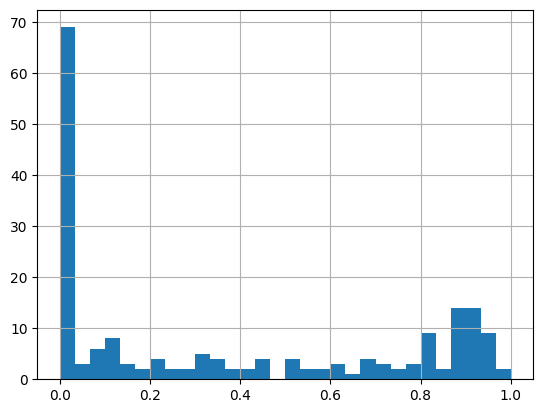

In [41]:
pps_scores_df['PPS'].hist(bins=30)

What we'll do next is to trim the dataset based on a threshold of 0.3 for all three tests - Spearman, Pearson and PPS.

We will then get the average of the 3 tests and display it in a "Signal" column.  

We can see that the features have been cut to 57.

In [45]:
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


corr_spearman_df = corr_spearman.reset_index()
corr_spearman_df.columns = ['Feature', 'Spearman']

corr_pearson_df = corr_pearson.reset_index()
corr_pearson_df.columns = ['Feature', 'Pearson']

feature_scores = pps_scores_df.merge(corr_pearson_df, on='Feature').merge(corr_spearman_df, on='Feature')

filtered_features = feature_scores[
    (feature_scores['PPS'] > 0.3) &
    (feature_scores['Pearson'] > 0.3) &
    (feature_scores['Spearman'] > 0.3)
]

filtered_features = filtered_features.copy()

filtered_features['Signal'] = filtered_features[['PPS', 'Pearson', 'Spearman']].mean(axis=1)
filtered_features = filtered_features.sort_values('Signal', ascending=False)

filtered_features


,Feature,PPS,Pearson,Spearman,Signal
25,Nasdaq_Close_lag1,0.878959,0.918619,0.976515,0.924698
31,Nasdaq_Close,0.875495,0.918533,0.976474,0.923501
34,Nasdaq_Close_lag7,0.873565,0.917767,0.976238,0.922524
36,Nasdaq_Close_lag3,0.867656,0.918349,0.976422,0.920809
1,CPI,0.940470,0.852412,0.964855,0.919246
4,CPI_lag30,0.939429,0.850889,0.964172,0.918163
5,CPI_lag90,0.939393,0.849240,0.962909,0.917181
38,Nasdaq_Close_lag30,0.857999,0.913837,0.974614,0.915483
10,CPI_lag365,0.928538,0.857997,0.959237,0.915258
0,Retail_Sales,0.940829,0.845509,0.957093,0.914477


The below code will simply reorder the columns to reflect Date and Bitcoin_close first.

In [51]:
final_feature_list = filtered_features['Feature'].tolist()
final_feature_list = [f for f in final_feature_list if f not in ['Date', 'Bitcoin_Close']]
ordered_columns = ['Date', 'Bitcoin_Close'] + final_feature_list

df_final = df[ordered_columns].sort_values('Date').reset_index(drop=True)

df_final.head()


,Date,Bitcoin_Close,Nasdaq_Close_lag1,Nasdaq_Close,Nasdaq_Close_lag7,Nasdaq_Close_lag3,CPI,CPI_lag30,CPI_lag90,Nasdaq_Close_lag30,CPI_lag365,Retail_Sales,Retail_Sales_lag30,Retail_Sales_lag90,Nasdaq_7d_avg,Nasdaq_Close_lag90,Nasdaq_30d_avg,Nasdaq_90d_avg,Retail_Sales_lag365,Real_GDP_lag30,M2_Money_Supply,M2_Money_Supply_lag30,M2_Money_Supply_lag365,M2_Money_Supply_lag90,Real_GDP,Real_GDP_lag90,Nasdaq_365d_avg,Real_GDP_lag365,Debt_to_GDP_lag365,Debt_to_GDP_lag90,Debt_to_GDP_lag30,Nasdaq_Close_lag365,Debt_to_GDP,Gold_Close_lag7,Gold_Close_lag1,Gold_Close,Gold_Close_lag30,Gold_Close_lag3,Gold_Close_lag90,Gold_365d_avg,Gold_90d_avg,Gold_30d_avg,Gold_7d_avg,Gold_Close_lag365,CPI_pct_change_365d,Fed_Funds_Rate_lag365,CPI_pct_change_90d,Fed_Funds_Rate_lag90,Fed_Funds_Rate,Fed_Funds_Rate_lag30,Consumer_Sentiment,Consumer_Sentiment_lag30,Nasdaq_365d_return,Unemployment_Rate,Ten_Year_Yield,Unemployment_Rate_lag30,Ten_Year_Yield_lag30,Unemployment_Rate_lag90
0,2011-07-18,13.1600,2789.800049,2765.110107,2802.620117,2789.800049,225.395,224.806,224.093,2616.479980,217.605,375442.0,375587.0,372820.0,2782.287144,2744.969971,2761.141333,2773.584890,347612.0,17035.114,9338.7,9176.7,8639.8,9030.4,17031.313,17035.114,2599.242301,16872.266,89.56528,92.1938,92.1938,2198.229980,94.52098,1548.800049,1589.800049,1602.099976,1538.599976,1589.800049,1494.500000,1388.803286,1524.225556,1532.963338,1586.800014,1181.699951,0.035799,0.18,0.00581,0.1,0.07,0.09,63.7,71.5,566.880127,9.0,2.94,9.1,2.94,9.1
1,2011-07-19,13.4800,2765.110107,2826.520020,2781.909912,2789.800049,225.395,224.806,224.093,2616.479980,217.605,375442.0,375587.0,372820.0,2788.660017,2802.510010,2768.142668,2773.851668,347612.0,17035.114,9338.7,9176.7,8639.8,9030.4,17031.313,17035.114,2600.963644,16872.266,89.56528,92.1938,92.1938,2198.229980,94.52098,1561.900024,1602.099976,1600.900024,1538.599976,1589.800049,1498.300049,1389.951780,1525.365556,1535.040007,1592.371443,1181.699951,0.035799,0.18,0.00581,0.1,0.07,0.09,63.7,71.5,628.290039,9.0,2.91,9.1,2.94,9.1
2,2011-07-20,13.8502,2826.520020,2814.229980,2796.919922,2789.800049,225.395,224.806,224.093,2629.659912,217.605,375442.0,375587.0,372820.0,2791.132882,2820.159912,2774.295003,2773.785780,347612.0,17035.114,9338.7,9176.7,8639.8,9030.4,17031.313,17035.114,2602.584849,16872.266,89.56528,92.1938,92.1938,2222.489990,94.52098,1585.199951,1600.900024,1596.699951,1541.500000,1589.800049,1503.199951,1391.061916,1526.404445,1536.880005,1594.014300,1191.500000,0.035799,0.18,0.00581,0.1,0.07,0.09,63.7,71.5,591.739990,9.0,2.96,9.1,2.97,9.1
3,2011-07-21,13.6894,2814.229980,2834.429932,2762.669922,2765.110107,225.395,224.806,224.093,2687.260010,217.605,375442.0,375587.0,372820.0,2801.384312,2820.159912,2779.200667,2773.944336,347612.0,17035.114,9338.7,9176.7,8639.8,9030.4,17031.313,17035.114,2604.357726,16872.266,89.56528,92.1938,92.1938,2187.330078,94.52098,1589.000000,1596.699951,1586.800049,1546.000000,1602.099976,1503.199951,1392.144656,1527.333335,1538.240007,1593.700021,1191.599976,0.035799,0.18,0.00581,0.1,0.07,0.09,63.7,71.5,647.099854,9.0,3.03,9.1,2.99,9.1
4,2011-07-22,13.6100,2834.429932,2858.830078,2789.800049,2826.520020,225.395,224.806,224.093,2669.189941,217.605,375442.0,375587.0,372820.0,2811.245745,2820.159912,2785.522005,2774.374004,347612.0,17035.114,9338.7,9176.7,8639.8,9030.4,17031.313,17035.114,2606.037014,16872.266,89.56528,92.1938,92.1938,2245.889893,94.52098,1589.800049,1586.800049,1601.300049,1552.900024,1600.900024,1503.199951,1393.256437,1528.423336,1539.853341,1595.342878,1195.500000,0.035799,0.18,0.00581,0.1,0.07,0.09,63.7,71.5,612.940186,9.0,2.99,9.1,3.01,9.1


The last job we'll perform is Redundancy Pruning to further cut down our column numbers.  This removes highly correlated features outside of the target variable (Bitcoin).

It reviews how stong the relationship is between the remaining features.  We only keep the upper section to avoid duplicate comparisons i.e. A -v- B and B -v- A.

It finds the features with correlation above .95 to another feature and we'll consider these redundant.  Therefore, these are the columns we'll drop.

What we're left with is 16 high-signal, non-redundant predictors.

In [53]:
import numpy as np

feature_only_df = df_final.drop(columns=['Date', 'Bitcoin_Close'])

corr_matrix = feature_only_df.corr().abs()

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

to_drop = [col for col in upper.columns if any(upper[col] > 0.95)]

df_final_pruned = df_final.drop(columns=to_drop)

df_final_pruned.head()


,Date,Bitcoin_Close,Nasdaq_Close_lag1,CPI,Debt_to_GDP_lag365,Debt_to_GDP_lag90,Gold_Close_lag7,Gold_Close_lag365,CPI_pct_change_365d,Fed_Funds_Rate_lag365,CPI_pct_change_90d,Fed_Funds_Rate_lag90,Consumer_Sentiment,Nasdaq_365d_return,Unemployment_Rate,Ten_Year_Yield,Unemployment_Rate_lag30,Unemployment_Rate_lag90
0,2011-07-18,13.1600,2789.800049,225.395,89.56528,92.1938,1548.800049,1181.699951,0.035799,0.18,0.00581,0.1,63.7,566.880127,9.0,2.94,9.1,9.1
1,2011-07-19,13.4800,2765.110107,225.395,89.56528,92.1938,1561.900024,1181.699951,0.035799,0.18,0.00581,0.1,63.7,628.290039,9.0,2.91,9.1,9.1
2,2011-07-20,13.8502,2826.520020,225.395,89.56528,92.1938,1585.199951,1191.500000,0.035799,0.18,0.00581,0.1,63.7,591.739990,9.0,2.96,9.1,9.1
3,2011-07-21,13.6894,2814.229980,225.395,89.56528,92.1938,1589.000000,1191.599976,0.035799,0.18,0.00581,0.1,63.7,647.099854,9.0,3.03,9.1,9.1
4,2011-07-22,13.6100,2834.429932,225.395,89.56528,92.1938,1589.800049,1195.500000,0.035799,0.18,0.00581,0.1,63.7,612.940186,9.0,2.99,9.1,9.1


At this point, we'll save the dataset before splitting it into Train and Test files.

In [56]:
import os
try:
  os.makedirs(name='outputs/datasets/final_features')
except Exception as e:
  print(e)

df_final_pruned.to_csv(f"outputs/datasets/final_features/BtcFinalFeatures.csv",index=False)

[Errno 17] File exists: 'outputs/datasets/final_features'


## Correlation, PPS & Pruning summary:

* Correlation Tests and PPS were used together to filter all three scores > 0.3 and this left us with 57 features.
* Signal score was introduced for each of the remaining features creating a power ranking of each feature.
* On the 57 remaining features, we removed highly correlated twins to reduce feature redundancy.
* We were left with a lean dataset of non-redundant features.
* The dataset is chronologically sorted with high signal and low noise and free of multicollinearity.


---

# Push Train and Test datasets to the repo

In [4]:
import pandas as pd
df_lean = (pd.read_csv("outputs/datasets/final_features/BtcFinalFeatures.csv"))
df_lean.head()

,Date,Bitcoin_Close,Nasdaq_Close_lag1,CPI,Debt_to_GDP_lag365,Debt_to_GDP_lag90,Gold_Close_lag7,Gold_Close_lag365,CPI_pct_change_365d,Fed_Funds_Rate_lag365,CPI_pct_change_90d,Fed_Funds_Rate_lag90,Consumer_Sentiment,Nasdaq_365d_return,Unemployment_Rate,Ten_Year_Yield,Unemployment_Rate_lag30,Unemployment_Rate_lag90
0,2011-07-18,13.1600,2789.800049,225.395,89.56528,92.1938,1548.800049,1181.699951,0.035799,0.18,0.00581,0.1,63.7,566.880127,9.0,2.94,9.1,9.1
1,2011-07-19,13.4800,2765.110107,225.395,89.56528,92.1938,1561.900024,1181.699951,0.035799,0.18,0.00581,0.1,63.7,628.290039,9.0,2.91,9.1,9.1
2,2011-07-20,13.8502,2826.520020,225.395,89.56528,92.1938,1585.199951,1191.500000,0.035799,0.18,0.00581,0.1,63.7,591.739990,9.0,2.96,9.1,9.1
3,2011-07-21,13.6894,2814.229980,225.395,89.56528,92.1938,1589.000000,1191.599976,0.035799,0.18,0.00581,0.1,63.7,647.099854,9.0,3.03,9.1,9.1
4,2011-07-22,13.6100,2834.429932,225.395,89.56528,92.1938,1589.800049,1195.500000,0.035799,0.18,0.00581,0.1,63.7,612.940186,9.0,2.99,9.1,9.1


Create the Outputs folder and save the Train and Test datasets in 'cleaned'

In [5]:
import os
try:
  os.makedirs(name='outputs/datasets/train_test_initial')
except Exception as e:
  print(e)

[Errno 17] File exists: 'outputs/datasets/train_test_initial'


Split the dataset into Train and Test

In [7]:
from sklearn.model_selection import train_test_split
features_train, features_test, target_train, target_test = train_test_split(
    df_lean.drop(['Bitcoin_Close', 'Date'], axis=1),
    df_lean['Bitcoin_Close'],
    test_size=0.2,
    shuffle=False,
    random_state=0
)

print(f"features_train shape: {features_train.shape} \nfeatures_test shape: {features_test.shape}")
print(f"target_train shape: {target_train.shape} \ntarget_test shape: {target_test.shape}")


features_train shape: (4103, 16) 
features_test shape: (1026, 16)
target_train shape: (4103,) 
target_test shape: (1026,)


Perform a final check on the train and test datasets for missing data

In [8]:
def check_missing_values(X_train, X_test, y_train, y_test):
    print('Missing Values Summary:\n')
    for name, df in zip(
        ['features_train', 'features_test', 'target_train', 'target_test'],
        [X_train, X_test, y_train, y_test]
    ):
        print(f"{name}:")
        print(df.isnull().sum())
        print()

check_missing_values(features_train, features_test, target_train, target_test)

Missing Values Summary:

features_train:
Nasdaq_Close_lag1          0
CPI                        0
Debt_to_GDP_lag365         0
Debt_to_GDP_lag90          0
Gold_Close_lag7            0
Gold_Close_lag365          0
CPI_pct_change_365d        0
Fed_Funds_Rate_lag365      0
CPI_pct_change_90d         0
Fed_Funds_Rate_lag90       0
Consumer_Sentiment         0
Nasdaq_365d_return         0
Unemployment_Rate          0
Ten_Year_Yield             0
Unemployment_Rate_lag30    0
Unemployment_Rate_lag90    0
dtype: int64

features_test:
Nasdaq_Close_lag1          0
CPI                        0
Debt_to_GDP_lag365         0
Debt_to_GDP_lag90          0
Gold_Close_lag7            0
Gold_Close_lag365          0
CPI_pct_change_365d        0
Fed_Funds_Rate_lag365      0
CPI_pct_change_90d         0
Fed_Funds_Rate_lag90       0
Consumer_Sentiment         0
Nasdaq_365d_return         0
Unemployment_Rate          0
Ten_Year_Yield             0
Unemployment_Rate_lag30    0
Unemployment_Rate_lag90    0
dt

In [9]:
features_train.to_csv("outputs/datasets/train_test_initial/features_train.csv", index=False)

In [10]:
features_test.to_csv("outputs/datasets/train_test_initial/features_test.csv", index=False)

In [11]:
target_train.to_csv("outputs/datasets/train_test_initial/target_train.csv", index=False)

In [12]:
target_test.to_csv("outputs/datasets/train_test_initial/target_test.csv", index=False)

We will also save the BitCoin price history & BitCoin distribution graphs from above.

In [13]:
import os
try:
  os.makedirs(name='outputs/datasets/figs')
except Exception as e:
  print(e)


[Errno 17] File exists: 'outputs/datasets/figs'


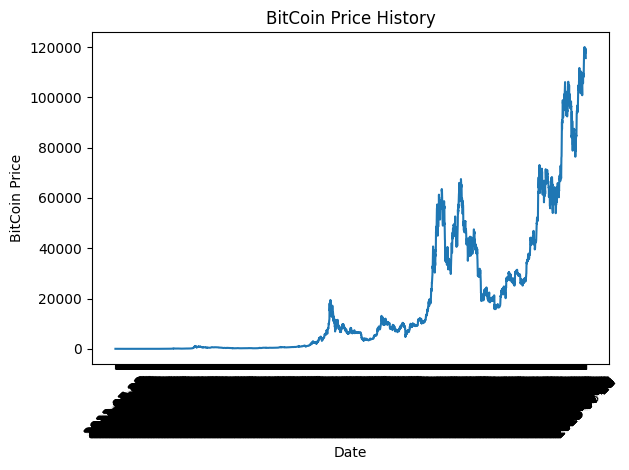

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.lineplot(data=df_lean, x="Date", y="Bitcoin_Close")

plt.title("BitCoin Price History")
plt.xlabel("Date")
plt.ylabel("BitCoin Price")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

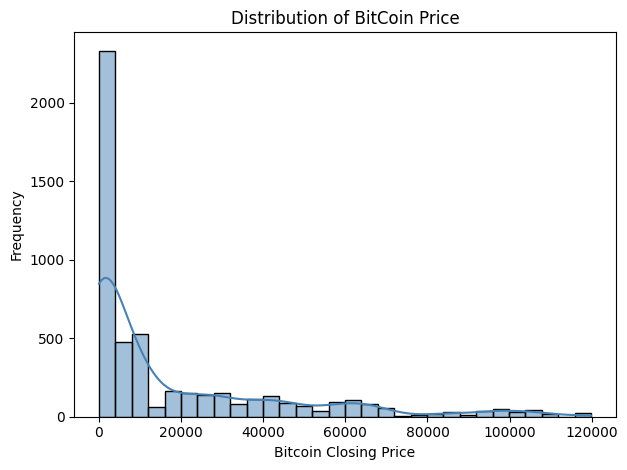

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(data=df_lean, x="Bitcoin_Close", kde=True, bins=30, color="steelblue")

plt.title("Distribution of BitCoin Price")
plt.xlabel("Bitcoin Closing Price")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()